In [1]:
import numpy as np
import matplotlib.pyplot as plt

## 数据生成与可视化

In [2]:
raw_data_x = np.vstack([np.random.random((5, 2))*5, np.random.random((5, 2))*5+4])
raw_data_x

array([[1.77673702, 0.4046763 ],
       [4.89759391, 0.13163186],
       [0.5963425 , 0.23006123],
       [1.40454243, 1.89307656],
       [1.32667293, 3.04723879],
       [4.88097166, 6.87431044],
       [5.44970689, 8.68475894],
       [4.27123747, 4.56910457],
       [5.32127527, 7.52607292],
       [6.96874192, 7.10801693]])

In [3]:
raw_data_y = [0]*5 + [1]*5
raw_data_y

[0, 0, 0, 0, 0, 1, 1, 1, 1, 1]

In [4]:
x_train = np.array(raw_data_x)
y_train = np.array(raw_data_y)
x_train, y_train

(array([[1.77673702, 0.4046763 ],
        [4.89759391, 0.13163186],
        [0.5963425 , 0.23006123],
        [1.40454243, 1.89307656],
        [1.32667293, 3.04723879],
        [4.88097166, 6.87431044],
        [5.44970689, 8.68475894],
        [4.27123747, 4.56910457],
        [5.32127527, 7.52607292],
        [6.96874192, 7.10801693]]), array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1]))

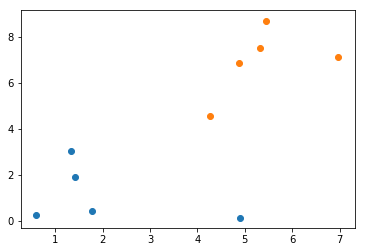

In [5]:
plt.scatter(x_train[y_train==0, 0], x_train[y_train==0, 1])
plt.scatter(x_train[y_train==1, 0], x_train[y_train==1, 1])

In [6]:
x = np.array([np.random.random()*8, np.random.random()*8])
x

array([1.13700942, 4.62115614])

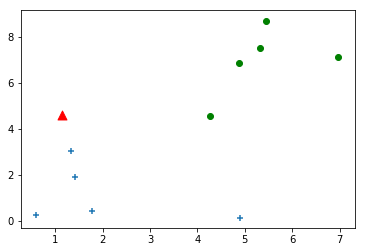

In [7]:
plt.scatter(x_train[y_train==0, 0], x_train[y_train==0, 1], marker='+')
plt.scatter(x_train[y_train==1, 0], x_train[y_train==1, 1], color='g')
plt.scatter(x[0], x[1], color='r', marker='^', s=80)

## KNN的过程

In [8]:
from math import sqrt

In [9]:
(x_train[0]-x)**2

array([ 0.4092514, 17.7787022])

In [10]:
# dis = []
# for i in x_train:
#     d = sqrt(np.sum((i - x)**2))
#     dis.append(d)

In [11]:
dis = [sqrt(np.sum((i-x)**2)) for i in x_train]
dis

[4.2647337087768,
 5.856434409390977,
 4.4242553308731045,
 2.741166192138187,
 1.5853037761407232,
 4.369663325171839,
 5.925557127169175,
 3.134660240290496,
 5.0937827030612075,
 6.339840733778019]

In [12]:
nearest = np.argsort(dis)
nearest

array([4, 3, 7, 0, 5, 2, 8, 1, 6, 9])

In [13]:
k = 5

In [14]:
topK_y = [y_train[i] for i in nearest[:k]]
topK_y

[0, 0, 1, 0, 1]

In [15]:
# 统计每种类别的个数
from collections import Counter
Counter(topK_y)

Counter({0: 3, 1: 2})

In [16]:
votes = Counter(topK_y)

In [17]:
votes.most_common(1)

[(0, 3)]

In [18]:
predict_y = votes.most_common(1)[0][0]
predict_y

0

## 使用魔法命令运行自己的kNN脚本

In [19]:
%run algorithm/kNN_simple.py

In [20]:
kNN_classify(7, x_train, y_train, x)

0

## 使用scikit-learn 中的kNN

In [21]:
from sklearn.neighbors import KNeighborsClassifier

In [22]:
kNN_classifier = KNeighborsClassifier(n_neighbors=5)

In [23]:
kNN_classifier.fit(x_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')

In [24]:
# 预测的输入参数要为矩阵形式
x_pre = x.reshape(1, -1)
x_pre

array([[1.13700942, 4.62115614]])

In [25]:
y_pre = kNN_classifier.predict(x_pre)
y_pre[0]

0

## train test split测试算法

In [26]:
from sklearn import datasets

In [27]:
iris = datasets.load_iris()

In [28]:
X = iris.data
y = iris.target

In [29]:
X.shape, y.shape

((150, 4), (150,))

In [30]:
shuffle_index = np.random.permutation(len(X))
shuffle_index

array([ 77,  26, 118, 105,  98,  24,  62,  59,  41, 106,  57, 140, 141,
        66,  23,  89,  40,  58,  93,  17, 116, 115,  91,  67, 113,  94,
        34, 143,  53,  44, 111,  50, 137,  75,  28,  87,  18, 119,  80,
        73,  83, 126, 117,  71,  38,  29,  51,  46,  33, 146, 122, 100,
        22,  86,  35,  37, 102,   6,  76, 114,  12,  96,  90,  60, 108,
        45,  55,  16,  56, 121, 131,  48,  49,   9, 136,  30, 149, 142,
       138,   8,  74, 130,  15, 132,  27,  43,  99,   2,  11,  88, 104,
        36,  81, 134,  68,   3,  79, 103,  14,  25, 127, 112,  64,  31,
        19, 120, 135, 124,  21,  84,  61, 147,  70,  47, 123, 109, 139,
         1,  65, 101,  72, 128, 107,  10,  13,  32, 145, 129,  52,  42,
         0, 148,  20,   5,  97,  63, 144, 133,   7,  39,  54,  78,  85,
        69, 110,  95, 125,  82,   4,  92])

In [31]:
test_ratio = 0.2
test_size = int(len(X) * test_ratio)

In [32]:
test_index = shuffle_index[:test_size]
train_index = shuffle_index[test_size:]

In [33]:
X_train = X[train_index]
y_train = y[train_index]

X_test = X[test_index]
y_test = y[test_index]

In [34]:
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(120, 4) (30, 4)
(120,) (30,)


## 使用自己的算法

In [35]:
from algorithm.model_selection import train_test_split

In [36]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [37]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((120, 4), (30, 4), (120,), (30,))

In [38]:
from algorithm.kNN import KNNClassifier

In [39]:
my_knn_clf = KNNClassifier(k=5)

In [40]:
my_knn_clf.fit(X_train, y_train)

KNN(k=5)

In [41]:
y_predict = my_knn_clf.predict(X_test)
y_predict

array([1, 1, 0, 0, 1, 1, 2, 1, 0, 0, 0, 0, 0, 1, 0, 2, 2, 1, 0, 0, 0, 1,
       2, 0, 1, 1, 0, 1, 2, 2])

In [42]:
sum(y_predict == y_test)

29

In [43]:
acc = sum(y_predict == y_test)/y_test.size
acc

0.9666666666666667

In [44]:
score = my_knn_clf.score(X_test, y_test)
score

0.9666666666666667

## 使用sklearn中的算法

In [45]:
from sklearn.model_selection import train_test_split

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [47]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((120, 4), (30, 4), (120,), (30,))

In [48]:
knn_clf = KNeighborsClassifier(5)

In [49]:
knn_clf.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')

In [50]:
y_pre = knn_clf.predict(X_test)
y_pre

array([1, 0, 1, 2, 1, 1, 2, 0, 0, 0, 2, 0, 1, 2, 2, 2, 0, 0, 0, 1, 0, 2,
       0, 1, 1, 0, 0, 0, 2, 1])

In [51]:
accuracy = sum(y_pre == y_test)/y_test.size
accuracy

1.0

## 使用kNN分类手写字体

In [52]:
digits = datasets.load_digits()

In [53]:
print(digits.DESCR)

.. _digits_dataset:

Optical recognition of handwritten digits dataset
--------------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 5620
    :Number of Attributes: 64
    :Attribute Information: 8x8 image of integer pixels in the range 0..16.
    :Missing Attribute Values: None
    :Creator: E. Alpaydin (alpaydin '@' boun.edu.tr)
    :Date: July; 1998

This is a copy of the test set of the UCI ML hand-written digits datasets
http://archive.ics.uci.edu/ml/datasets/Optical+Recognition+of+Handwritten+Digits

The data set contains images of hand-written digits: 10 classes where
each class refers to a digit.

Preprocessing programs made available by NIST were used to extract
normalized bitmaps of handwritten digits from a preprinted form. From a
total of 43 people, 30 contributed to the training set and different 13
to the test set. 32x32 bitmaps are divided into nonoverlapping blocks of
4x4 and the number of on pixels are counted in each bloc

In [54]:
digits.data, digits.target

(array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ..., 10.,  0.,  0.],
        [ 0.,  0.,  0., ..., 16.,  9.,  0.],
        ...,
        [ 0.,  0.,  1., ...,  6.,  0.,  0.],
        [ 0.,  0.,  2., ..., 12.,  0.,  0.],
        [ 0.,  0., 10., ..., 12.,  1.,  0.]]), array([0, 1, 2, ..., 8, 9, 8]))

In [55]:
X = digits.data
y = digits.target

In [56]:
X[:3], y[:20]

(array([[ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.,  0.,  0., 13., 15., 10.,
         15.,  5.,  0.,  0.,  3., 15.,  2.,  0., 11.,  8.,  0.,  0.,  4.,
         12.,  0.,  0.,  8.,  8.,  0.,  0.,  5.,  8.,  0.,  0.,  9.,  8.,
          0.,  0.,  4., 11.,  0.,  1., 12.,  7.,  0.,  0.,  2., 14.,  5.,
         10., 12.,  0.,  0.,  0.,  0.,  6., 13., 10.,  0.,  0.,  0.],
        [ 0.,  0.,  0., 12., 13.,  5.,  0.,  0.,  0.,  0.,  0., 11., 16.,
          9.,  0.,  0.,  0.,  0.,  3., 15., 16.,  6.,  0.,  0.,  0.,  7.,
         15., 16., 16.,  2.,  0.,  0.,  0.,  0.,  1., 16., 16.,  3.,  0.,
          0.,  0.,  0.,  1., 16., 16.,  6.,  0.,  0.,  0.,  0.,  1., 16.,
         16.,  6.,  0.,  0.,  0.,  0.,  0., 11., 16., 10.,  0.,  0.],
        [ 0.,  0.,  0.,  4., 15., 12.,  0.,  0.,  0.,  0.,  3., 16., 15.,
         14.,  0.,  0.,  0.,  0.,  8., 13.,  8., 16.,  0.,  0.,  0.,  0.,
          1.,  6., 15., 11.,  0.,  0.,  0.,  1.,  8., 13., 15.,  1.,  0.,
          0.,  0.,  9., 16., 16.,  5.,  0.,  0

In [57]:
X.shape, y.shape

((1797, 64), (1797,))

In [58]:
# 可视化数据特征
some_digit = X[111]
y[111]

4

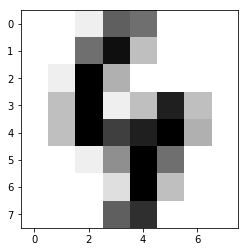

In [59]:
some_digit_image = some_digit.reshape(8, 8)
plt.imshow(some_digit_image, cmap=plt.cm.gray_r)

In [60]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=111)

In [62]:
X_train.shape, X_test.shape

((1437, 64), (360, 64))

In [63]:
knn_clf = KNeighborsClassifier(7)

In [64]:
knn_clf.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=7, p=2,
           weights='uniform')

In [65]:
knn_clf.predict(X_test)

array([7, 1, 2, 9, 5, 8, 6, 4, 7, 3, 8, 4, 4, 5, 7, 1, 6, 1, 0, 6, 6, 8,
       8, 0, 8, 4, 5, 8, 0, 0, 3, 3, 5, 2, 1, 4, 8, 6, 7, 3, 3, 9, 6, 0,
       4, 9, 7, 3, 8, 7, 4, 3, 5, 0, 3, 1, 7, 6, 5, 7, 6, 0, 9, 7, 7, 8,
       2, 8, 6, 6, 1, 1, 2, 6, 4, 6, 4, 8, 6, 9, 8, 1, 3, 4, 4, 2, 0, 7,
       6, 0, 8, 2, 0, 5, 8, 5, 3, 3, 7, 4, 7, 3, 4, 2, 4, 9, 1, 8, 5, 1,
       2, 7, 0, 2, 8, 9, 7, 5, 7, 7, 8, 8, 9, 2, 3, 9, 7, 7, 8, 2, 5, 3,
       2, 4, 0, 1, 4, 8, 7, 9, 6, 8, 1, 5, 2, 6, 1, 4, 1, 6, 1, 3, 4, 2,
       7, 7, 0, 7, 1, 5, 4, 6, 1, 7, 4, 9, 6, 8, 9, 8, 4, 3, 5, 2, 5, 6,
       7, 9, 0, 2, 0, 5, 4, 8, 0, 8, 6, 9, 7, 3, 1, 9, 4, 2, 7, 9, 4, 0,
       5, 2, 8, 2, 9, 1, 8, 5, 4, 5, 7, 7, 5, 5, 0, 1, 4, 8, 6, 5, 7, 6,
       0, 6, 7, 1, 9, 0, 6, 1, 2, 9, 1, 5, 3, 0, 2, 1, 0, 9, 3, 4, 1, 0,
       9, 9, 2, 0, 5, 3, 6, 5, 5, 3, 9, 1, 2, 8, 7, 4, 9, 8, 1, 1, 3, 1,
       6, 3, 0, 7, 2, 4, 7, 2, 5, 0, 6, 4, 7, 4, 1, 0, 3, 1, 8, 0, 5, 6,
       9, 5, 5, 0, 6, 0, 5, 2, 9, 7, 2, 9, 1, 0, 3,

In [66]:
knn_clf.score(X_test, y_test)

0.9777777777777777

## 寻找最好的K（超参数）

In [67]:
best_score = 0.0
best_k = -1

In [68]:
for k in range(1, 11):
    knn_clf = KNeighborsClassifier(k)
    knn_clf.fit(X_train, y_train)
    score = knn_clf.score(X_test, y_test)
    if score > best_score:
        best_k = k
        best_score = score
        
print("best_k =", best_k)
print("best_score =", best_score)

best_k = 1
best_score = 0.9916666666666667


### 考虑距离权重

In [69]:
best_method = ""
best_score = 0.0
best_k = -1

In [70]:
for method in ["uniform", "distance"]:
    for k in range(1, 11):
        knn_clf = KNeighborsClassifier(k, weights=method)
        knn_clf.fit(X_train, y_train)
        score = knn_clf.score(X_test, y_test)
        if score > best_score:
            best_method = method
            best_k = k
            best_score = score

print("best_method =", best_method)  
print("best_k =", best_k)
print("best_score =", best_score)

best_method = uniform
best_k = 1
best_score = 0.9916666666666667


### 考虑p的权重（Minkowski距离参数）

In [71]:
best_p = -1
best_k = -1
best_score = 0.0

In [72]:
%%time

for k in range(1, 11):
    for p in range(1, 6):
        knn_clf = KNeighborsClassifier(k, weights="distance", p=p)
        knn_clf.fit(X_train, y_train)
        score = knn_clf.score(X_test, y_test)
        if score > best_score:
            best_p = p
            best_k = k
            best_score = score
            
print("best_p =", best_p)  
print("best_k =", best_k)
print("best_score =", best_score)

best_p = 2
best_k = 1
best_score = 0.9916666666666667
CPU times: user 12.3 s, sys: 19.4 ms, total: 12.4 s
Wall time: 12.4 s


## Grid Search寻找超参数

In [73]:
param_grid = [
    {
        'weights': ['uniform'],
        'n_neighbors': [i for i in range(1, 11)]
    },
    {
        'weights': ['distance'],
        'n_neighbors': [i for i in range(1, 11)],
        'p': [i for i in range(1, 6)]
    }
]

In [74]:
knn_clf = KNeighborsClassifier()

In [75]:
from sklearn.model_selection import GridSearchCV

In [76]:
grid_search = GridSearchCV(knn_clf, param_grid)

In [77]:
%%time
grid_search.fit(X_train, y_train)

/Users/aeternae/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


CPU times: user 1min 39s, sys: 82 ms, total: 1min 39s
Wall time: 1min 39s


GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid=[{'weights': ['uniform'], 'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}, {'weights': ['distance'], 'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 'p': [1, 2, 3, 4, 5]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [78]:
grid_search.best_estimator_

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=1, p=4,
           weights='distance')

In [79]:
grid_search.best_score_

0.9895615866388309

In [80]:
grid_search.best_params_

{'n_neighbors': 1, 'p': 4, 'weights': 'distance'}

In [81]:
knn_clf = grid_search.best_estimator_

In [82]:
knn_clf.score(X_test, y_test)

0.9888888888888889

In [83]:
%%time
## 使用多核(n_jobs=-1)搜索，并随时输出(verbose)

grid_search = GridSearchCV(knn_clf, param_grid, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 60 candidates, totalling 180 fits


/Users/aeternae/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   25.3s


CPU times: user 475 ms, sys: 107 ms, total: 582 ms
Wall time: 31.8 s


[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:   31.7s finished


## 数据归一化处理

In [84]:
import numpy as np
import matplotlib.pyplot as plt

### 最值归一化 Normaliztion

In [85]:
x = np.random.randint(0, 100, size=100)
x

array([12, 83,  8, 85, 68, 63, 62, 39, 57, 72, 30, 48, 73, 13,  6, 83, 23,
       33,  4, 61, 92, 95, 24, 69, 90, 35, 98, 34, 76, 59, 29, 19, 89, 10,
       86, 19, 73, 71, 83, 94, 42, 52, 34, 99,  3, 49, 93, 14, 94, 23,  9,
       86, 14,  2, 72, 42,  1, 32,  5, 38, 35, 33, 72, 55, 17, 75, 76, 37,
       15, 80, 10, 52, 36, 30, 40, 59, 64, 86, 36, 27,  2, 37, 76,  7, 71,
        0, 87, 65, 41, 68, 39, 21, 21, 21, 27, 40, 70, 77, 60, 89])

In [86]:
(x - np.min(x))/(np.max(x) - np.min(x))

array([0.12121212, 0.83838384, 0.08080808, 0.85858586, 0.68686869,
       0.63636364, 0.62626263, 0.39393939, 0.57575758, 0.72727273,
       0.3030303 , 0.48484848, 0.73737374, 0.13131313, 0.06060606,
       0.83838384, 0.23232323, 0.33333333, 0.04040404, 0.61616162,
       0.92929293, 0.95959596, 0.24242424, 0.6969697 , 0.90909091,
       0.35353535, 0.98989899, 0.34343434, 0.76767677, 0.5959596 ,
       0.29292929, 0.19191919, 0.8989899 , 0.1010101 , 0.86868687,
       0.19191919, 0.73737374, 0.71717172, 0.83838384, 0.94949495,
       0.42424242, 0.52525253, 0.34343434, 1.        , 0.03030303,
       0.49494949, 0.93939394, 0.14141414, 0.94949495, 0.23232323,
       0.09090909, 0.86868687, 0.14141414, 0.02020202, 0.72727273,
       0.42424242, 0.01010101, 0.32323232, 0.05050505, 0.38383838,
       0.35353535, 0.33333333, 0.72727273, 0.55555556, 0.17171717,
       0.75757576, 0.76767677, 0.37373737, 0.15151515, 0.80808081,
       0.1010101 , 0.52525253, 0.36363636, 0.3030303 , 0.40404

In [87]:
X = np.random.randint(0, 100, (50, 2))
X = np.array(X, dtype=float)
X[:10, :]

array([[71., 31.],
       [85., 28.],
       [62., 70.],
       [26., 20.],
       [42., 89.],
       [99., 11.],
       [82., 37.],
       [21., 91.],
       [89., 28.],
       [43., 50.]])

In [88]:
X[:, 0] = (X[:, 0] - np.min(X[:, 0])) / (np.max(X[:, 0]) - np.min(X[:, 0]))
X[:, 1] = (X[:, 1] - np.min(X[:, 1])) / (np.max(X[:, 1]) - np.min(X[:, 1]))

In [89]:
X[:10, :]

array([[0.71428571, 0.32608696],
       [0.85714286, 0.29347826],
       [0.62244898, 0.75      ],
       [0.25510204, 0.20652174],
       [0.41836735, 0.95652174],
       [1.        , 0.10869565],
       [0.82653061, 0.39130435],
       [0.20408163, 0.97826087],
       [0.89795918, 0.29347826],
       [0.42857143, 0.5326087 ]])

In [90]:
import matplotlib.pyplot as plt

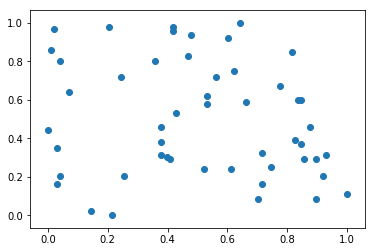

In [91]:
plt.scatter(X[:, 0], X[:, 1])

### 均值方差归一化 Standardization

In [92]:
X2 = np.random.randint(0, 100, (50, 2))

In [93]:
X2 = np.array(X2, dtype=float)

In [94]:
X2[:, 0] = (X2[:, 0] - np.mean(X2[:, 0])) / np.std(X2[:, 0])
X2[:, 1] = (X2[:, 1] - np.mean(X2[:, 1])) / np.std(X2[:, 1])

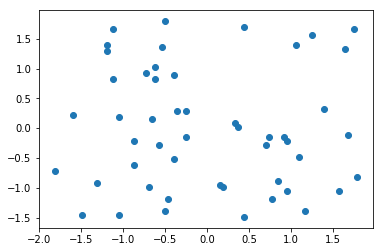

In [95]:
plt.scatter(X2[:, 0], X2[:, 1])

In [96]:
np.mean(X2[:, 0])

-1.376676550535194e-16

In [97]:
np.std(X2[:, 0])

1.0

### scikit—learn中的StandardScaler

In [98]:
from sklearn import datasets

In [99]:
iris = datasets.load_iris()

In [100]:
X = iris.data
y = iris.target

In [101]:
from sklearn.model_selection import train_test_split

In [102]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=666)

In [103]:
## 均值方差归一化包StandarScaler, 最值归一化minmaxScaler
from sklearn.preprocessing import StandardScaler

In [104]:
standardScaler = StandardScaler()

In [105]:
standardScaler.fit(X_train)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [106]:
standardScaler.mean_

array([5.83416667, 3.08666667, 3.70833333, 1.17      ])

In [107]:
standardScaler.scale_

array([0.81019502, 0.44327067, 1.76401924, 0.75317107])

In [108]:
X_train = standardScaler.transform(X_train)
X_train

array([[-0.90616043,  0.93246262, -1.30856471, -1.28788802],
       [-1.15301457, -0.19551636, -1.30856471, -1.28788802],
       [-0.16559799, -0.64670795,  0.22203084,  0.17260355],
       [ 0.45153738,  0.70686683,  0.95898425,  1.50032315],
       [-0.90616043, -1.32349533, -0.40154513, -0.09294037],
       [ 1.43895396,  0.25567524,  0.56216318,  0.30537551],
       [ 0.3281103 , -1.09789954,  1.0723617 ,  0.30537551],
       [ 2.1795164 , -0.19551636,  1.63924894,  1.23477923],
       [-0.78273335,  2.2860374 , -1.25187599, -1.42065998],
       [ 0.45153738, -2.00028272,  0.44878573,  0.43814747],
       [ 1.80923518, -0.42111215,  1.46918276,  0.83646335],
       [ 0.69839152,  0.25567524,  0.90229552,  1.50032315],
       [ 0.20468323,  0.70686683,  0.44878573,  0.57091943],
       [-0.78273335, -0.87230374,  0.10865339,  0.30537551],
       [-0.53587921,  1.38365421, -1.25187599, -1.28788802],
       [-0.65930628,  1.38365421, -1.25187599, -1.28788802],
       [-1.0295875 ,  0.

In [109]:
## 训练数据集进行了归一化处理后，测试数据集同样也要进行归一化处理
X_test_standard = standardScaler.transform(X_test)
X_test_standard

array([[-0.28902506, -0.19551636,  0.44878573,  0.43814747],
       [-0.04217092, -0.64670795,  0.78891808,  1.63309511],
       [-1.0295875 , -1.77468693, -0.23147896, -0.22571233],
       [-0.04217092, -0.87230374,  0.78891808,  0.96923531],
       [-1.52329579,  0.03007944, -1.25187599, -1.28788802],
       [-0.41245214, -1.32349533,  0.16534211,  0.17260355],
       [-0.16559799, -0.64670795,  0.44878573,  0.17260355],
       [ 0.82181859, -0.19551636,  0.8456068 ,  1.10200727],
       [ 0.57496445, -1.77468693,  0.39209701,  0.17260355],
       [-0.41245214, -1.09789954,  0.39209701,  0.03983159],
       [ 1.06867274,  0.03007944,  0.39209701,  0.30537551],
       [-1.64672287, -1.77468693, -1.36525344, -1.15511606],
       [-1.27644165,  0.03007944, -1.19518726, -1.28788802],
       [-0.53587921,  0.70686683, -1.25187599, -1.0223441 ],
       [ 1.68580811,  1.15805842,  1.35580532,  1.76586707],
       [-0.04217092, -0.87230374,  0.22203084, -0.22571233],
       [-1.52329579,  1.

In [110]:
from sklearn.neighbors import KNeighborsClassifier

In [111]:
knn_clf = KNeighborsClassifier(5)

In [112]:
knn_clf.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')

In [113]:
knn_clf.score(X_test_standard, y_test)

1.0

## 使用kNN识别deecamp试题

In [114]:
import imageio

In [115]:
picsets = imageio.imread('/Users/aeternae/Desktop/Data/number_matrix.bmp')

In [116]:
picsets.shape

(3360, 2240)

In [117]:
some_pic = picsets[:28, :28]
some_pic

Array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  22,
        211, 255, 218,  30,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  

In [118]:
picframe = [picsets[28*i:28*(i+1), 28*j:28*(j+1)] for i in range(120) for j in range(80)]
picframe

[Array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0,   0],
        [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  22,
         211, 255, 218,  30,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           0

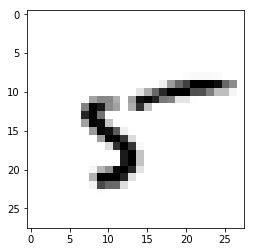

In [119]:
plt.imshow(picframe[48], cmap=plt.cm.gray_r)

In [120]:
picframe = [picframe[i].reshape(1, -1).flatten() for i in range(9600)]
picframe

[Array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,  22, 211, 255, 218,
         30,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0

In [121]:
pic_sets = picframe[0] 
for i in range(9599):
    pic_sets = np.vstack([pic_sets, picframe[i+1]])

pic_sets

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [122]:
pic_sets.shape

(9600, 784)

In [123]:
sub_pic_sets = np.vstack([pic_sets[:24], pic_sets[48]])

In [124]:
y_train = np.array([0, 1, 8, 0, 4, 3, 9, 4, 6, 1, 0, 2, 6, 2, 3, 0, 1, 1, 0, 9, 9, 4, 2, 7, 5])

In [125]:
sub_pic_sets.shape, y_train.shape

((25, 784), (25,))

In [126]:
from sklearn.neighbors import KNeighborsClassifier

In [127]:
knn_clf = KNeighborsClassifier(1)

In [128]:
knn_clf.fit(sub_pic_sets, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=1, p=2,
           weights='uniform')

In [129]:
y_pre = knn_clf.predict(pic_sets)
y_pre

array([0, 1, 8, ..., 8, 1, 8])

In [130]:
y_pre[:10]

array([0, 1, 8, 0, 4, 3, 9, 4, 6, 1])

In [131]:
sum(y_pre)

41969